# **1. Importing all required libraries**

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

# sklearn: data preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder

# sklearn: train model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_validate, StratifiedKFold
from sklearn.metrics import precision_recall_curve, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix, classification_report

# sklearn classifiers

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

from sklearn import datasets, ensemble, model_selection
from sklearn.ensemble import RandomForestClassifier

from sklearn.neural_network import MLPClassifier

# **2. Connect to Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


# **3. Combining the testing and training set into one dataset**

In [ ]:
UNSWtrain = pd.read_csv("/content/drive/MyDrive/dataset/UNSW_NB15_training-set.csv")
UNSWtrain.head()

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.0902,...,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.0003,...,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.0051,...,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.6608,...,1,3,0,0,0,2,3,0,Normal,0
4,5,0.000010,udp,-,INT,2,0,2126,0,100000.0025,...,1,3,0,0,0,2,3,0,Normal,0


In [ ]:
UNSWtest = pd.read_csv("/content/drive/MyDrive/dataset/UNSW_NB15_testing-set.csv")
UNSWtest.head()

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,tcp,-,FIN,6,4,258,172,74.087490,...,1,1,0,0,0,1,1,0,Normal,0
1,2,0.649902,tcp,-,FIN,14,38,734,42014,78.473372,...,1,2,0,0,0,1,6,0,Normal,0
2,3,1.623129,tcp,-,FIN,8,16,364,13186,14.170161,...,1,3,0,0,0,2,6,0,Normal,0
3,4,1.681642,tcp,ftp,FIN,12,12,628,770,13.677108,...,1,3,1,1,0,2,1,0,Normal,0
4,5,0.449454,tcp,-,FIN,10,6,534,268,33.373826,...,1,40,0,0,0,2,39,0,Normal,0


In [ ]:
CombineData = pd.concat([UNSWtrain,UNSWtest])
CombineData.head()

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.0902,...,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.0003,...,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.0051,...,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.6608,...,1,3,0,0,0,2,3,0,Normal,0
4,5,0.000010,udp,-,INT,2,0,2126,0,100000.0025,...,1,3,0,0,0,2,3,0,Normal,0


In [ ]:
CombineData.tail()

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
175336,175337,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,13,24,0,0,0,24,24,0,Generic,1
175337,175338,0.505762,tcp,-,FIN,10,8,620,354,33.612649,...,1,2,0,0,0,1,1,0,Shellcode,1
175338,175339,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,3,13,0,0,0,3,12,0,Generic,1
175339,175340,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,14,30,0,0,0,30,30,0,Generic,1
175340,175341,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,16,30,0,0,0,30,30,0,Generic,1


In [ ]:
CombineData.to_csv("UNSW-NB15.csv", index=False)

In [ ]:
CombinedData = pd.read_csv("UNSW-NB15.csv",  low_memory=False)
CombinedData.head()

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.0902,...,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.0003,...,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.0051,...,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.6608,...,1,3,0,0,0,2,3,0,Normal,0
4,5,0.000010,udp,-,INT,2,0,2126,0,100000.0025,...,1,3,0,0,0,2,3,0,Normal,0


In [ ]:
CombinedData.shape

(257673, 45)

In [ ]:
CombinedData.columns

Index(['id', 'dur', 'proto', 'service', 'state', 'spkts', 'dpkts', 'sbytes',
       'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sloss', 'dloss',
       'sinpkt', 'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin',
       'tcprtt', 'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm',
       'ct_srv_dst', 'is_sm_ips_ports', 'attack_cat', 'label'],
      dtype='object')

# **4. Preprocessing phase: Tidy Data by checking for NULL values**

In [ ]:
CombinedData.isnull().sum()

id                   0
dur                  0
proto                0
service              0
state                0
spkts                0
dpkts                0
sbytes               0
dbytes               0
rate                 0
sttl                 0
dttl                 0
sload                0
dload                0
sloss                0
dloss                0
sinpkt               0
dinpkt               0
sjit                 0
djit                 0
swin                 0
stcpb                0
dtcpb                0
dwin                 0
tcprtt               0
synack               0
ackdat               0
smean                0
dmean                0
trans_depth          0
response_body_len    0
ct_srv_src           0
ct_state_ttl         0
ct_dst_ltm           0
ct_src_dport_ltm     0
ct_dst_sport_ltm     0
ct_dst_src_ltm       0
is_ftp_login         0
ct_ftp_cmd           0
ct_flw_http_mthd     0
ct_src_ltm           0
ct_srv_dst           0
is_sm_ips_ports      0
attack_cat 

In [ ]:
data_to_use = CombinedData.dropna()

In [ ]:
data_to_use.shape

(257673, 45)

# **5. Preprocessing Phase: Check for Imbalance**

In [ ]:
X = CombinedData.drop(axis=1, columns=['attack_cat']) # X is a dataframe
X = X.drop(axis=1, columns=['label'])


y1 = CombinedData['attack_cat'].values # y is an array
y2 = CombinedData['label'].values

In [ ]:
def data_ratio(y2):
    '''
    Calculate Y2's ratio
    '''
    unique, count = np.unique(y2, return_counts=True)
    ratio = round(count[0]/count[1], 1)
    return f'{ratio}:1 ({count[0]}/{count[1]})'

In [ ]:
CombinedData.label.value_counts()

1    164673
0     93000
Name: label, dtype: int64

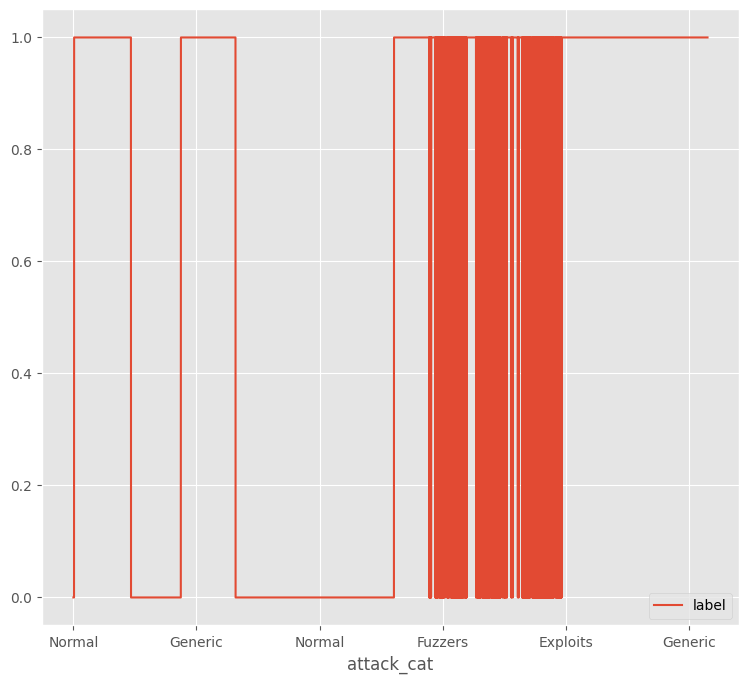

In [ ]:
import pandas as pd
import matplotlib.pyplot as mp
 
pd.DataFrame(CombinedData, columns=["attack_cat", "label"])
 
# plot the dataframe
CombinedData.plot(x="attack_cat", y=["label"], kind="line", figsize=(9, 8))
 
# print bar graph
mp.show()

# **6. Preprocessing phase: Determining which are categorical and numerical columns**

In [ ]:
import pandas as pd

numerical_cols = CombinedData.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = CombinedData.select_dtypes(include=['object', 'bool']).columns


In [ ]:
numerical_cols

Index(['id', 'dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl',
       'dttl', 'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit',
       'djit', 'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat',
       'smean', 'dmean', 'trans_depth', 'response_body_len', 'ct_srv_src',
       'ct_state_ttl', 'ct_dst_ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm',
       'ct_dst_src_ltm', 'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd',
       'ct_src_ltm', 'ct_srv_dst', 'is_sm_ips_ports', 'label'],
      dtype='object')

In [ ]:
categorical_cols

Index(['proto', 'service', 'state', 'attack_cat'], dtype='object')

# **7. Preprocessing Phase: Correlation and Dropping highly correlated features**

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


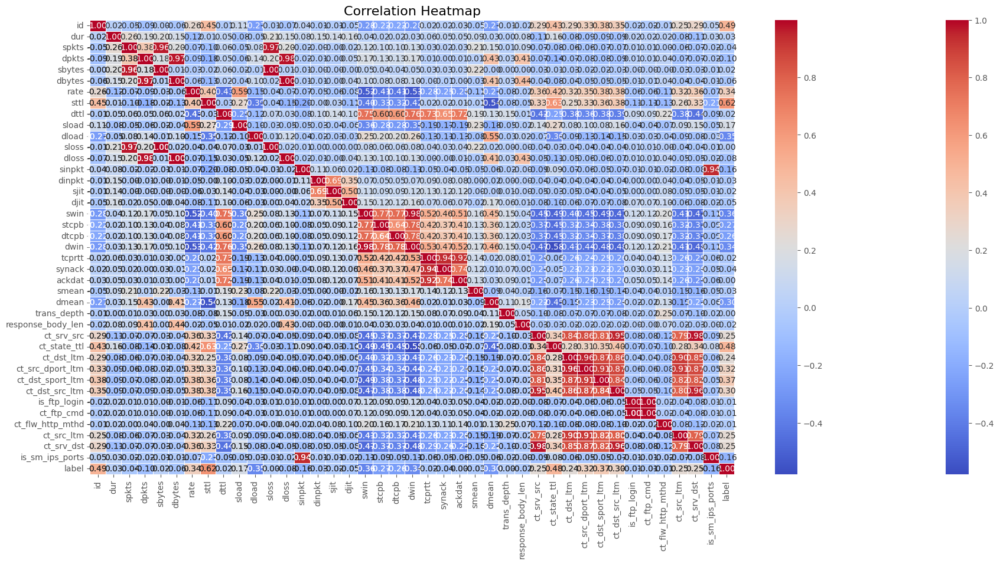

In [ ]:
# Create correlation matrix
corr = CombinedData.corr()

# Set up figure and axes
fig, ax = plt.subplots(figsize=(22, 10))

# Create heatmap with coolwarm color palette and annotations
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt='.2f', linewidths=.5, ax=ax)

# Remove duplicate information
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt='.2f', linewidths=.5, ax=ax, mask=mask)

# Set plot title
plt.title('Correlation Heatmap', fontsize=16)

# Show plot
plt.show()

<Axes: >

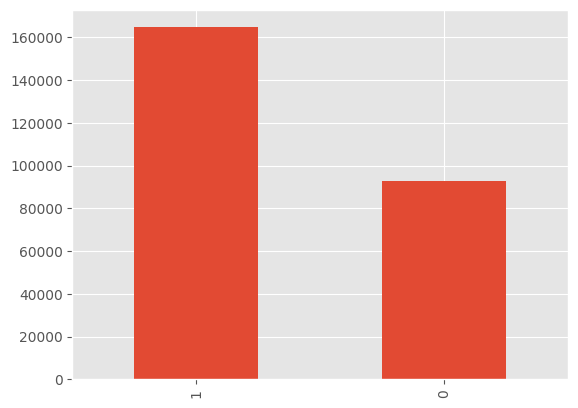

In [ ]:
CombinedData['label'].value_counts().plot.bar()

# **8. Preprocessing phase: Dropping Unnecassary columns**

In [ ]:
CombinedData = CombinedData.drop(columns=['id', 'attack_cat'])

# **9. Preprocessing phase: Encoding the categorical columns using LabelEncoder()**

In [ ]:
from sklearn.preprocessing import LabelEncoder
categorical_cols = CombinedData.select_dtypes(exclude=[np.number])
print(categorical_cols.columns)
for feature in categorical_cols.columns:
    CombinedData[feature] = LabelEncoder().fit_transform(CombinedData[feature])

Index(['proto', 'service', 'state'], dtype='object')


In [ ]:
CombinedData

,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,...,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,label
0,0.000011,119,0,5,2,0,496,0,90909.090200,254,...,1,1,2,0,0,0,1,2,0,0
1,0.000008,119,0,5,2,0,1762,0,125000.000300,254,...,1,1,2,0,0,0,1,2,0,0
2,0.000005,119,0,5,2,0,1068,0,200000.005100,254,...,1,1,3,0,0,0,1,3,0,0
3,0.000006,119,0,5,2,0,900,0,166666.660800,254,...,2,1,3,0,0,0,2,3,0,0
4,0.000010,119,0,5,2,0,2126,0,100000.002500,254,...,2,1,3,0,0,0,2,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257668,0.000009,119,2,5,2,0,114,0,111111.107200,254,...,24,13,24,0,0,0,24,24,0,1
257669,0.505762,113,0,4,10,8,620,354,33.612649,254,...,1,1,2,0,0,0,1,1,0,1
257670,0.000009,119,2,5,2,0,114,0,111111.107200,254,...,3,3,13,0,0,0,3,12,0,1
257671,0.000009,119,2,5,2,0,114,0,111111.107200,254,...,30,14,30,0,0,0,30,30,0,1


# **10. Preprocessing Phase: Dropping Highly Correlated Features**

In [ ]:
columns = CombinedData.columns.tolist()

# compute correlation matrix
corr = CombinedData.corr()

# find highly correlated variables
correlated_vars = []
for i in range(len(columns) - 1):
    for j in range(i+1, len(columns)):
        if corr[columns[i]][columns[j]] > 0.98:
            print(columns[i], columns[j], corr[columns[i]][columns[j]])
            correlated_vars.append(columns[j])

sbytes sloss 0.995771577240686
dbytes dloss 0.9967111338314709
swin dwin 0.9804584289136614
is_ftp_login ct_ftp_cmd 0.9988554882935945


In [ ]:
CombinedData = CombinedData.drop(columns=correlated_vars)

# **11. Splitting the data into testing and training set using the function train_test_split**

In [ ]:
from sklearn.model_selection import train_test_split
X = CombinedData.drop(columns=['label'])
feature_list = list(X.columns)
X = np.array(X)
y = CombinedData['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [ ]:
print("Training set:", len(X_train))
print("Testing set:", len(X_test))

Training set: 180371
Testing set: 77302


In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
X_train

array([[-0.16494928,  0.4156418 , -0.69247518, ...,  0.1420399 ,
        -0.37929625, -0.12022629],
       [-0.00534656,  0.13440777,  1.53209399, ..., -0.57242172,
        -0.74716906, -0.12022629],
       [-0.20863696,  0.13440777, -0.69247518, ..., -0.21519091,
         0.08054477, -0.12022629],
       ...,
       [-0.20846916,  0.4156418 ,  0.19735249, ..., -0.45334478,
        -0.65520086, -0.12022629],
       [-0.05412334,  0.13440777, -0.69247518, ..., -0.45334478,
        -0.47126445, -0.12022629],
       [-0.14683448,  0.13440777, -0.69247518, ..., -0.33426785,
         0.26448118, -0.12022629]])

In [ ]:
X_test

array([[-0.2086383 , -4.88093239, -0.69247518, ..., -0.57242172,
        -0.65520086,  8.31764801],
       [-0.20636141,  0.13440777, -0.69247518, ...,  0.02296297,
         0.17251298, -0.12022629],
       [-0.20863696,  0.4156418 ,  0.19735249, ...,  2.40450172,
         2.28778166, -0.12022629],
       ...,
       [-0.07163127,  0.13440777, -0.69247518, ..., -0.45334478,
        -0.56323265, -0.12022629],
       [-0.20863679,  0.4156418 ,  0.19735249, ...,  1.21373234,
         0.632354  , -0.12022629],
       [-0.2086383 , -4.88093239, -0.69247518, ..., -0.57242172,
        -0.65520086,  8.31764801]])

In [ ]:
CombinedData

,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,...,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,label
0,0.000011,119,0,5,2,0,496,0,90909.090200,254,...,1,1,1,2,0,0,1,2,0,0
1,0.000008,119,0,5,2,0,1762,0,125000.000300,254,...,1,1,1,2,0,0,1,2,0,0
2,0.000005,119,0,5,2,0,1068,0,200000.005100,254,...,1,1,1,3,0,0,1,3,0,0
3,0.000006,119,0,5,2,0,900,0,166666.660800,254,...,2,2,1,3,0,0,2,3,0,0
4,0.000010,119,0,5,2,0,2126,0,100000.002500,254,...,2,2,1,3,0,0,2,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257668,0.000009,119,2,5,2,0,114,0,111111.107200,254,...,24,24,13,24,0,0,24,24,0,1
257669,0.505762,113,0,4,10,8,620,354,33.612649,254,...,1,1,1,2,0,0,1,1,0,1
257670,0.000009,119,2,5,2,0,114,0,111111.107200,254,...,3,3,3,13,0,0,3,12,0,1
257671,0.000009,119,2,5,2,0,114,0,111111.107200,254,...,30,30,14,30,0,0,30,30,0,1


# **12. MODEL TRAINING: Decision Tree Classifier**

In [ ]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
DTclf = tree.DecisionTreeClassifier()
DTclf.fit(X_train, y_train)

DecisionTreeClassifier()

# **13. Scaling for the numerical columns**

In [ ]:
numerical_cols = CombinedData.select_dtypes(include=['float64', 'int64']).columns.tolist()
scaler = StandardScaler()
CombinedData[numerical_cols] = scaler.fit_transform(CombinedData[numerical_cols])
print(CombinedData[numerical_cols])

             dur     proto   service     state     spkts     dpkts    sbytes  \
0      -0.208678  0.415177 -0.692762  0.742077 -0.130765 -0.165331 -0.046480   
1      -0.208679  0.415177 -0.692762  0.742077 -0.130765 -0.165331 -0.039194   
2      -0.208679  0.415177 -0.692762  0.742077 -0.130765 -0.165331 -0.043188   
3      -0.208679  0.415177 -0.692762  0.742077 -0.130765 -0.165331 -0.044155   
4      -0.208678  0.415177 -0.692762  0.742077 -0.130765 -0.165331 -0.037100   
...          ...       ...       ...       ...       ...       ...       ...   
257668 -0.208678  0.415177  0.197734  0.742077 -0.130765 -0.165331 -0.048678   
257669 -0.124024  0.134145 -0.692762 -0.384788 -0.071919 -0.093893 -0.045766   
257670 -0.208678  0.415177  0.197734  0.742077 -0.130765 -0.165331 -0.048678   
257671 -0.208678  0.415177  0.197734  0.742077 -0.130765 -0.165331 -0.048678   
257672 -0.208678  0.415177  0.197734  0.742077 -0.130765 -0.165331 -0.048678   

          dbytes      rate      sttl  .

In [ ]:
feature_names = np.array(numerical_cols)
feature_names

array(['dur', 'proto', 'service', 'state', 'spkts', 'dpkts', 'sbytes',
       'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sinpkt',
       'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'tcprtt',
       'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_flw_http_mthd', 'ct_src_ltm', 'ct_srv_dst',
       'is_sm_ips_ports', 'label'], dtype='<U17')

# **14. Feature Importance of the Decision Tree Classifier**

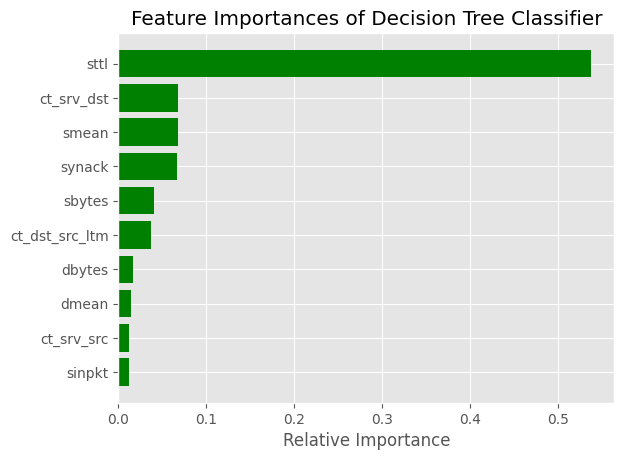

In [ ]:
importances = DTclf.feature_importances_
indices = np.argsort(importances)
features = np.array(numerical_cols)
plt.title('Feature Importances of Decision Tree Classifier')
count = 10 # top # importance
plt.barh(range(count), importances[indices][len(indices)-count:], color='g', align='center')
plt.yticks(range(count), [features[i] for i in indices[len(indices)-count:]])
plt.xlabel('Relative Importance')
plt.show()

In [ ]:
DTclf.feature_importances_

array([7.14231423e-03, 2.02537338e-03, 2.13966398e-03, 8.42302193e-04,
       1.32290129e-03, 2.83337806e-03, 4.02732195e-02, 1.61363764e-02,
       7.62712922e-03, 5.37172422e-01, 0.00000000e+00, 9.47128386e-03,
       8.33081709e-03, 1.21954290e-02, 6.39396354e-03, 7.31193460e-03,
       6.01409948e-03, 1.20142546e-03, 1.04418537e-02, 1.03284610e-02,
       9.23751229e-03, 6.70916080e-02, 7.89661483e-03, 6.72739807e-02,
       1.44800870e-02, 3.65801915e-03, 3.30528497e-03, 1.23179636e-02,
       2.45684175e-04, 5.66928579e-03, 3.01923942e-03, 3.37523614e-03,
       3.66675970e-02, 1.78976134e-04, 9.45435834e-04, 7.59496390e-03,
       6.78381628e-02, 0.00000000e+00])

In [ ]:
!pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# **15. Training the Decision Tree Classifier**

In [ ]:
DTclf = DecisionTreeClassifier(criterion="entropy", max_depth=5)

# Train Decision Tree Classifer
DTclf = DTclf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = DTclf.predict(X_test)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics


# Compute the accuracy score of the model
accuracy = metrics.accuracy_score(y_test, y_pred)
report=metrics.classification_report(y_test,y_pred)
print("Model accuracy:", accuracy)
print(report)

Model accuracy: 0.8948410131691289
              precision    recall  f1-score   support

           0       1.00      0.71      0.83     27871
           1       0.86      1.00      0.92     49431

    accuracy                           0.89     77302
   macro avg       0.93      0.85      0.88     77302
weighted avg       0.91      0.89      0.89     77302



# **16. Decision Tree Visualization**

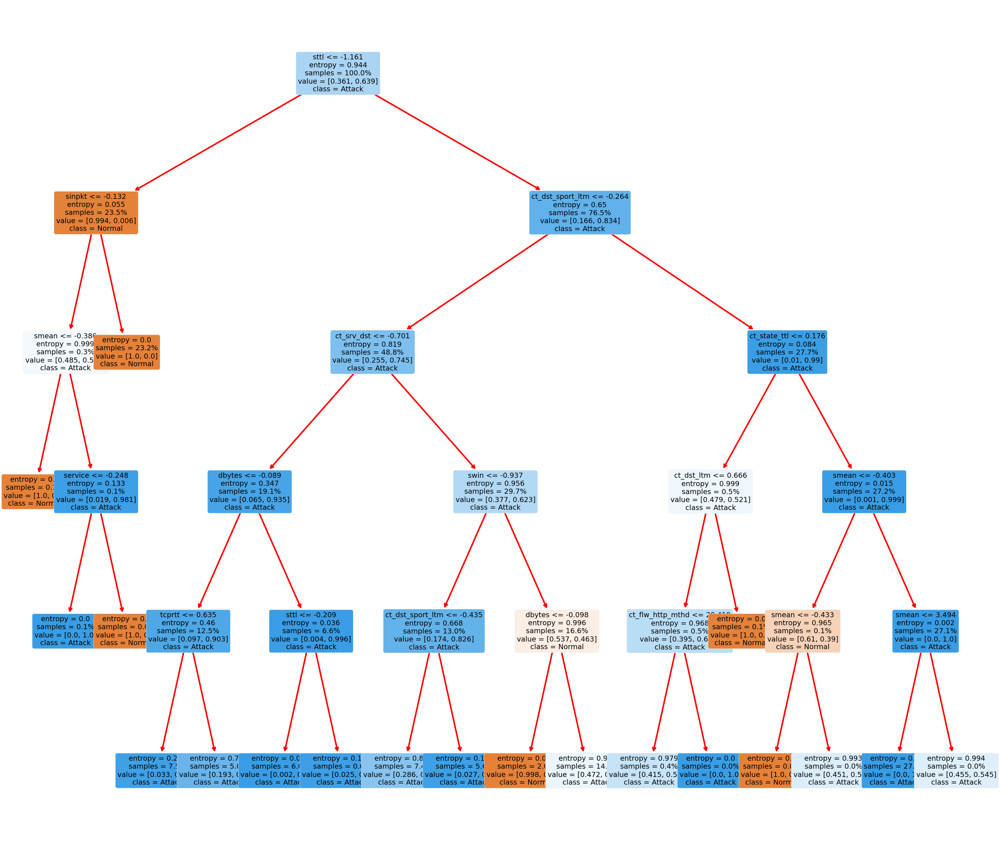

In [ ]:
fig = plt.figure(figsize=(35, 30))
DTtree = tree.plot_tree(DTclf, feature_names = np.array(numerical_cols), class_names = ['Normal', 'Attack'], fontsize=14, proportion=True, filled=True, rounded=True)
for o in DTtree:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('red')
        arrow.set_linewidth(3)

fig.savefig('Decision Tree Classifier XAI Visualization Part 2.png')

In [ ]:
# import eli5 #for purmutation importance
# from eli5.sklearn import PermutationImportance
# perm = PermutationImportance(DTclf, random_state=1).fit(X_test, y_test)
# eli5.show_weights(perm, feature_names = np.array(numerical_cols))

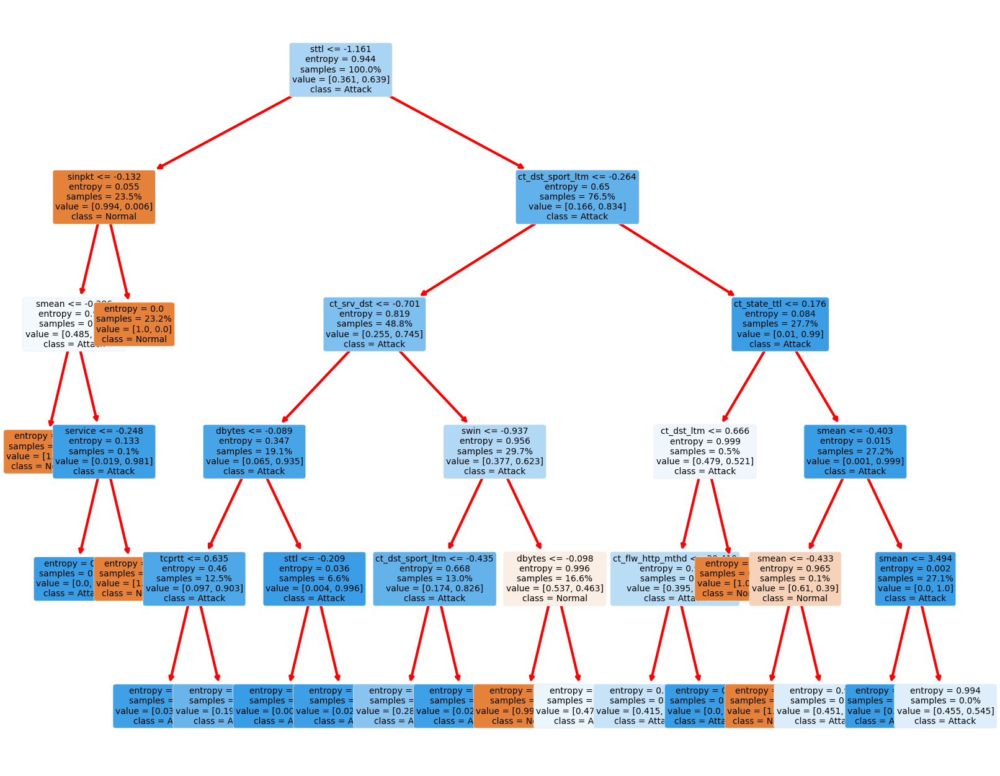

In [ ]:
fig = plt.figure(figsize=(20, 16))
DTtree = tree.plot_tree(DTclf, feature_names = features, class_names = ['Normal', 'Attack'], fontsize=10, proportion=True, filled=True, rounded=True, max_depth=8) 
for o in DTtree:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('red')
        arrow.set_linewidth(3)

fig.savefig('Decision Tree Classifier (Depth = 8 Nodes) Explainable AI Visualization.png')

## **17. Train scores of the Decision Tree Classifier and get the metric results**

In [ ]:
from sklearn.model_selection import cross_val_score, cross_validate, StratifiedKFold

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)

DTclf = tree.DecisionTreeClassifier()

# define metrics for evaluating
scoring = ['accuracy', 'precision_micro', 'recall_micro', 'f1_micro', 'roc_auc_ovr']  

# perform the 5-fold CV and get the metrics results
cv_results = cross_validate(estimator=DTclf,
                            X=X_train,
                            y=y_train,
                            scoring=scoring,
                            cv=cv,
                            return_train_score=False) # prevent to show the train scores on cv splits.

In [ ]:
cv_results

{'fit_time': array([3.55735683, 2.67411804, 2.83825874, 2.74135923, 7.01501942]),
 'score_time': array([0.07886839, 0.06720352, 0.07327104, 0.0788846 , 0.10758257]),
 'test_accuracy': array([0.93427581, 0.9338859 , 0.93438488, 0.93566003, 0.93067029]),
 'test_precision_micro': array([0.93427581, 0.9338859 , 0.93438488, 0.93566003, 0.93067029]),
 'test_recall_micro': array([0.93427581, 0.9338859 , 0.93438488, 0.93566003, 0.93067029]),
 'test_f1_micro': array([0.93427581, 0.9338859 , 0.93438488, 0.93566003, 0.93067029]),
 'test_roc_auc_ovr': array([0.9311899 , 0.93047958, 0.93145367, 0.93187999, 0.92671472])}

In [ ]:
cv_results['test_accuracy'].mean()

0.9337753824038681

In [ ]:
from sklearn.metrics import precision_recall_curve, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix, classification_report


DTclf.fit(X=X_train, y=y_train)

# predition on testing data
y_pred_class = DTclf.predict(X=X_test)
y_pred_score = DTclf.predict_proba(X=X_test)[:, 1]

# AUC of ROC
auc_ontest = roc_auc_score(y_true=y_test, y_score=y_pred_score)
# confusion matrix
cm_ontest = confusion_matrix(y_true=y_test, y_pred=y_pred_class)
# precision score
precision_ontest = precision_score(y_true=y_test, y_pred=y_pred_class)
# recall score
recall_ontest = recall_score(y_true=y_test, y_pred=y_pred_class)
# classifition report
cls_report_ontest = classification_report(y_true=y_test, y_pred=y_pred_class)

# print the above results
print('The model scores {:1.5f} ROC AUC on the test set.'.format(auc_ontest))
print('The precision score on the test set: {:1.5f}'.format(precision_ontest))
print('The recall score on the test set: {:1.5f}'.format(recall_ontest))
print('Confusion Matrix:\n', cm_ontest)
# Print classification report:
print('Classification Report:\n', cls_report_ontest)

The model scores 0.93235 ROC AUC on the test set.
The precision score on the test set: 0.94951
The recall score on the test set: 0.95042
Confusion Matrix:
 [[25373  2498]
 [ 2451 46980]]
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.91      0.91     27871
           1       0.95      0.95      0.95     49431

    accuracy                           0.94     77302
   macro avg       0.93      0.93      0.93     77302
weighted avg       0.94      0.94      0.94     77302



In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import lime
import lime.lime_tabular
from __future__ import print_function
import xgboost as xgb
np.random.seed(1)

In [ ]:
y_train.shape

(180371,)

In [ ]:
X_train.shape

(180371, 38)

In [ ]:
y_test.shape

(77302,)

# **18. Model Training: MLP Classifier**

In [ ]:
from sklearn.neural_network import MLPClassifier
MLP = MLPClassifier(random_state=123, solver='adam', max_iter=8000)
MLP.fit(X_train, y_train)

MLPClassifier(max_iter=8000, random_state=123)

In [ ]:
accuracy = MLP.score(X_test, y_test)

print("Accuracy:", accuracy)

Accuracy: 0.936948591239554


# **19. Model Training: XGboost**

In [ ]:
import xgboost
gbtree = xgboost.XGBClassifier(n_estimators=300, max_depth=5)
gbtree.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=300, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [ ]:
metrics.accuracy_score(y_test, gbtree.predict(X_test))

In [ ]:
predict_fn = lambda x: gbtree.predict_proba(x).astype(float)

In [ ]:
features = np.array(numerical_cols)
explainer = lime.lime_tabular.LimeTabularExplainer(X_train,feature_names = features, class_names = ['Normal', 'Attack'], kernel_width=3)

In [ ]:
feature_names

array(['dur', 'proto', 'service', 'state', 'spkts', 'dpkts', 'sbytes',
       'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sinpkt',
       'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'tcprtt',
       'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_flw_http_mthd', 'ct_src_ltm', 'ct_srv_dst',
       'is_sm_ips_ports', 'label'], dtype='<U17')

# **20. LIME explainer for the MLP classifier**

In [ ]:
np.random.seed(1)
i = 20
exp = explainer.explain_instance(X_test[i], predict_fn, num_features=10)
exp.show_in_notebook(show_all=False)
print('True class: ')
if (y_test[i] == 0):
    print('Normal')
else:
    print('Attack')

True class: 
Normal


In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from sklearn.model_selection import train_test_split
import xgboost
import shap
import numpy as np
import matplotlib.pylab as pl

In [ ]:
xg_train = xgboost.DMatrix(X_train, label=y_train)
xg_test = xgboost.DMatrix(X_test, label=y_test)

# **21. Training the XGboost Model**

In [ ]:
params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(y_train),
    "eval_metric": "logloss"
}
model = xgboost.train(params, xg_train, 500, evals = [(xg_test, "test")], verbose_eval=100, early_stopping_rounds=20)

[0]	test-logloss:0.64612
[100]	test-logloss:0.28682
[200]	test-logloss:0.19298
[300]	test-logloss:0.15793
[400]	test-logloss:0.14168
[499]	test-logloss:0.13368


# **22. Explain predictions: The Tree SHAP implementation integrated into XGBoost to explain the testing dataset**

In [ ]:
explainer = shap.TreeExplainer(model)
shap_values_test = explainer.shap_values(X_test)

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values_test[:1000,:], X_test[:1000])

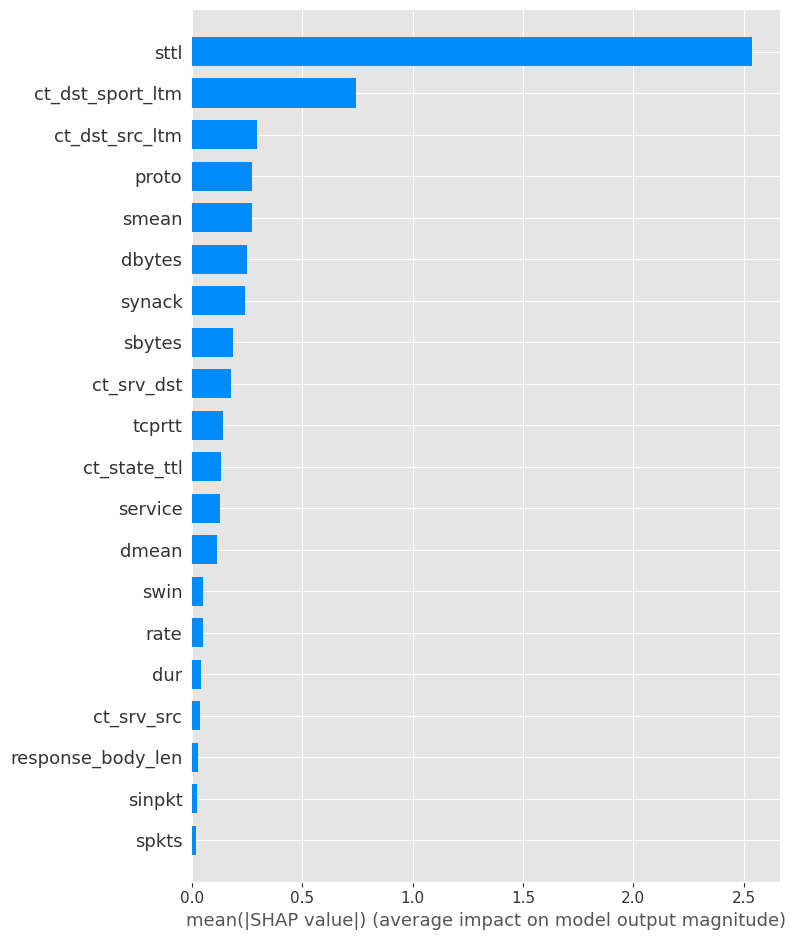

In [ ]:
shap.summary_plot(shap_values_test, X_test, plot_type="bar", feature_names=feature_names)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


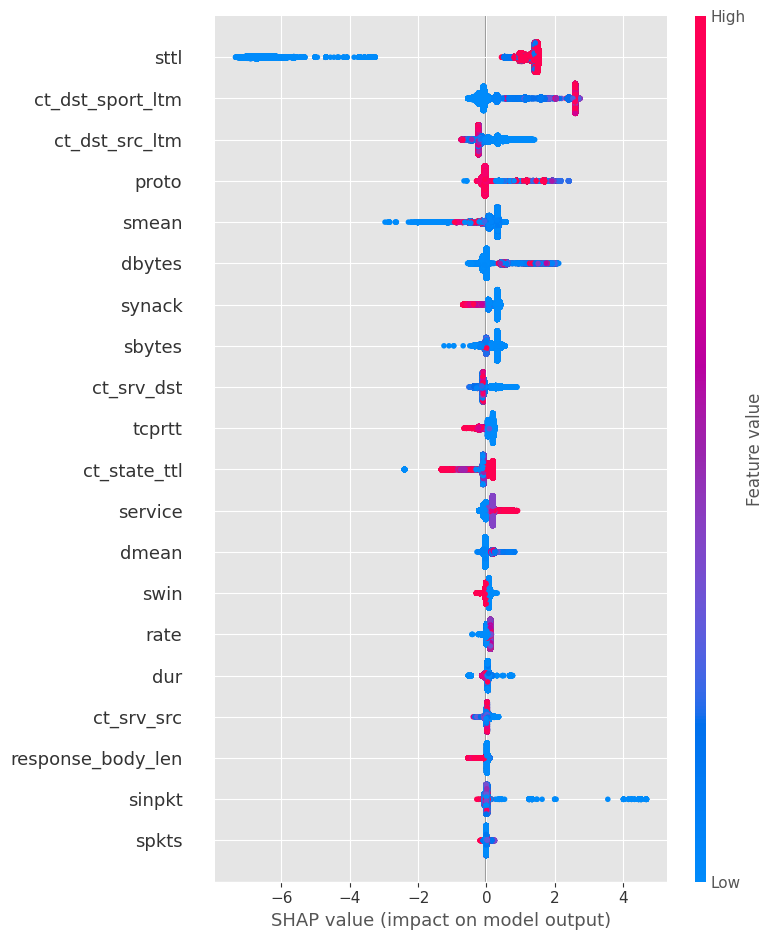

In [ ]:
shap.summary_plot(shap_values_test, X_test, feature_names=feature_names)

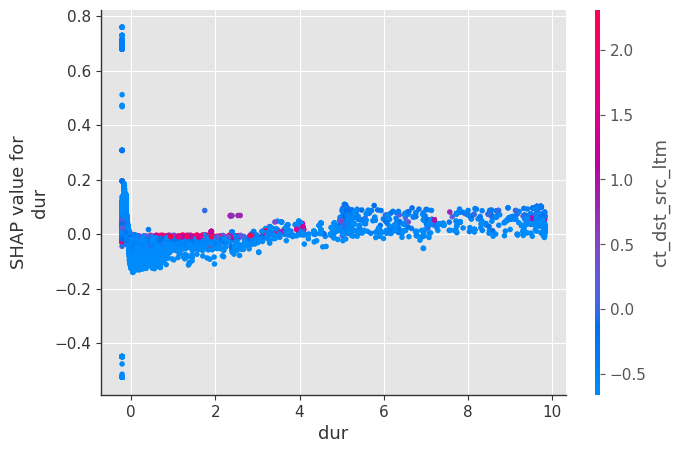

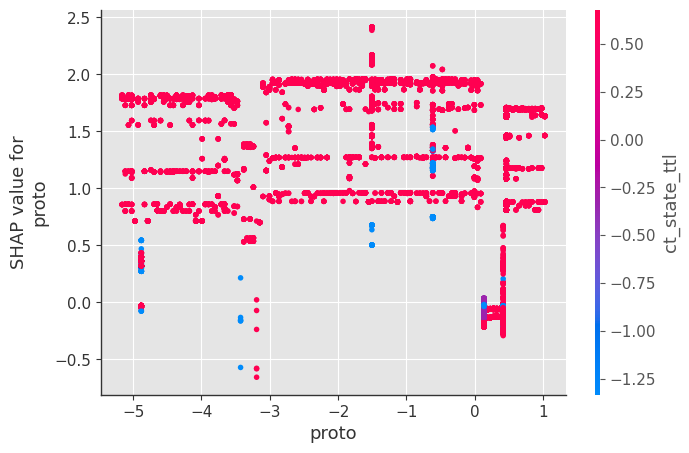

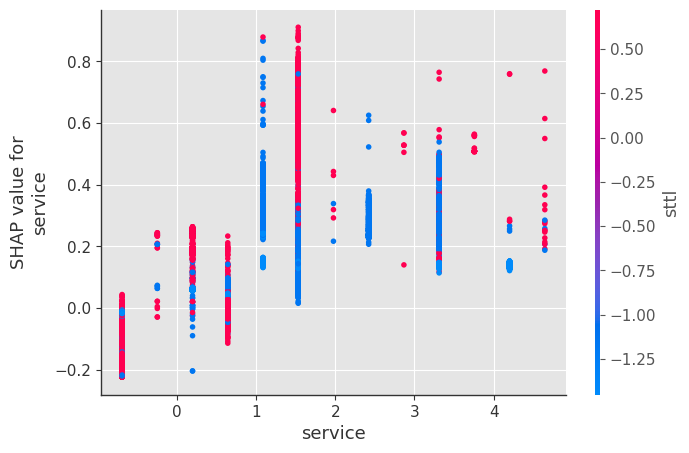

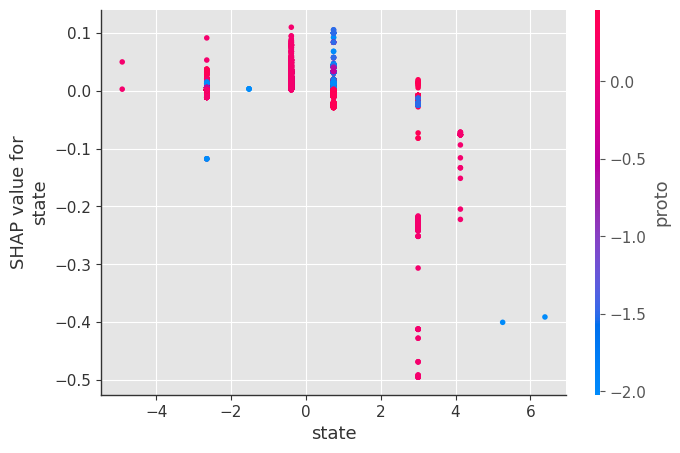

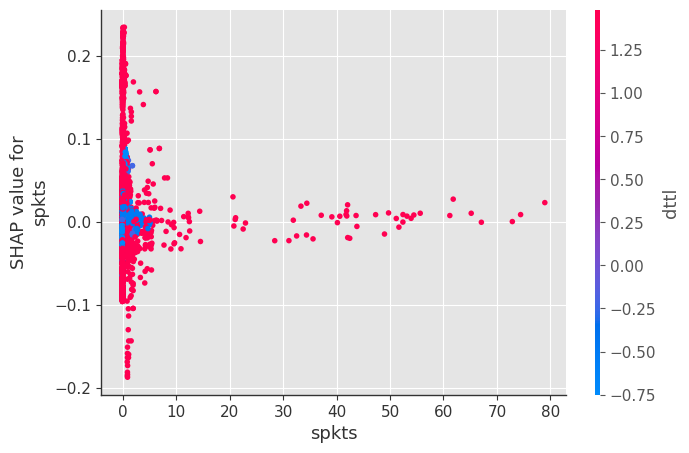

...

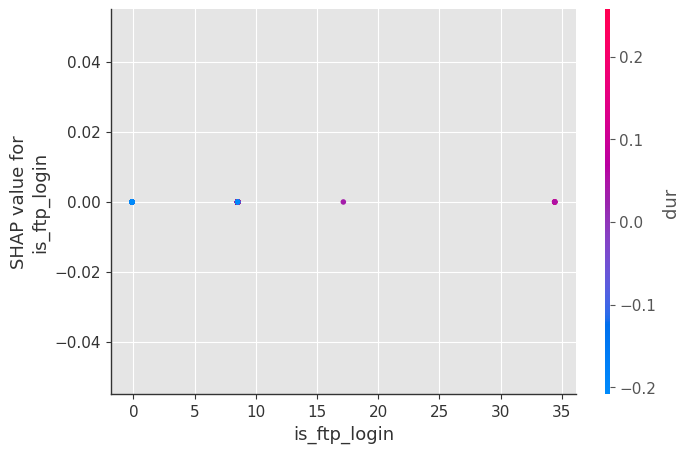

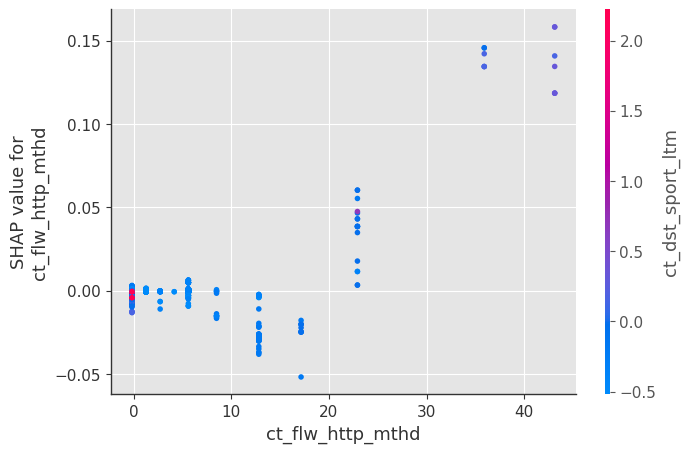

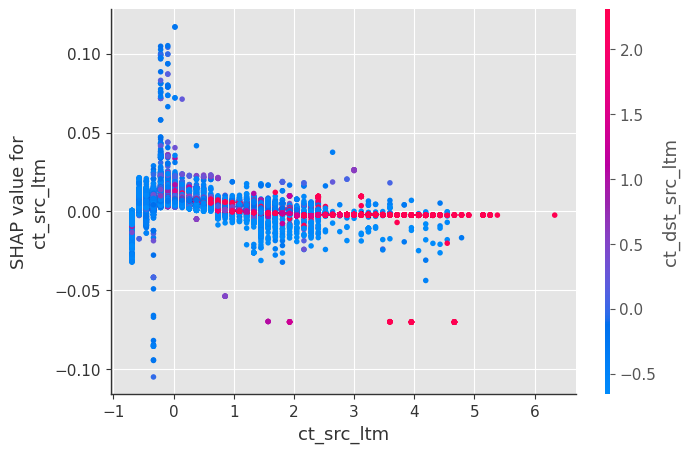

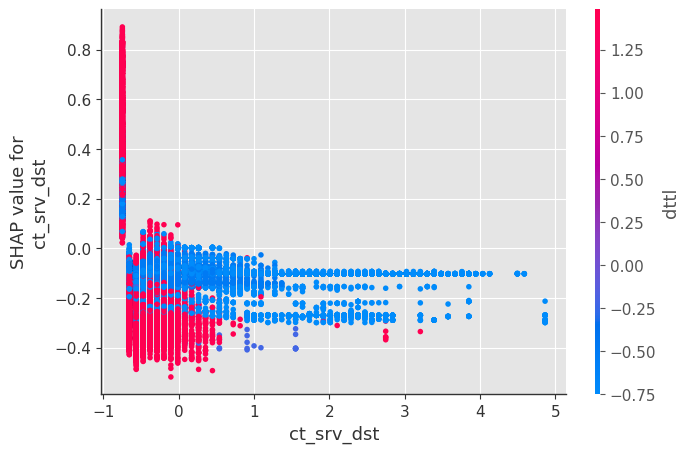

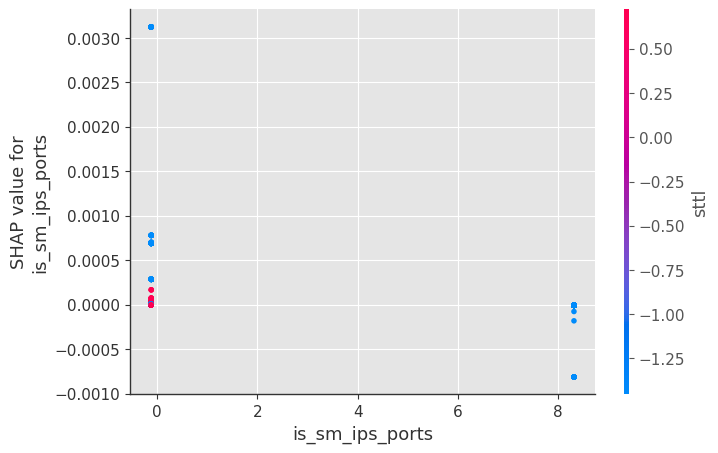

In [ ]:
X_test = pd.DataFrame(X_test)
for name in X_test.columns:
    shap.dependence_plot(name, shap_values_test, X_test, display_features=X_test, feature_names = feature_names)

In [ ]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X_test[:2000,:])

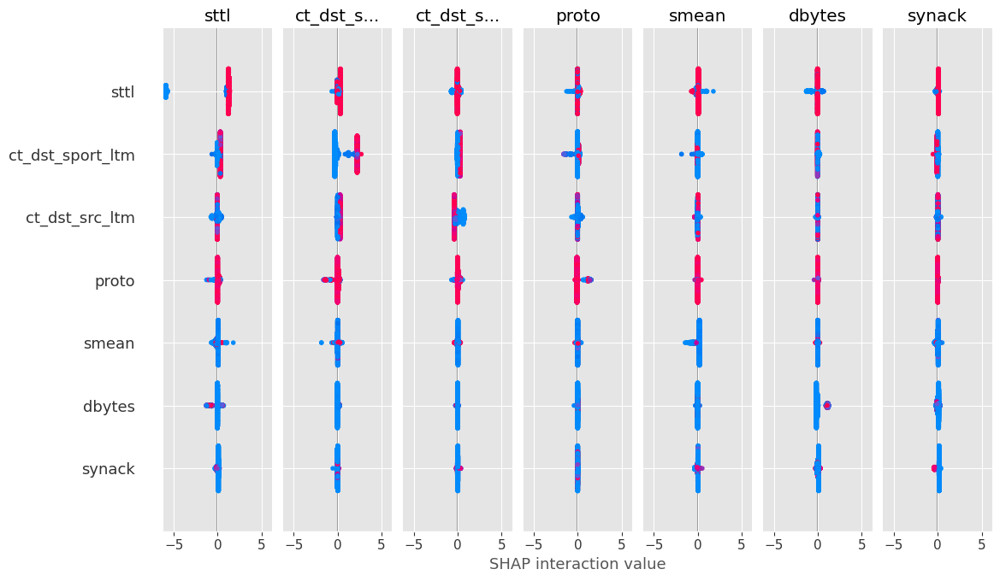

In [ ]:
shap.summary_plot(shap_interaction_values, X_test[:2000,:], feature_names=feature_names)

In [ ]:
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)

In [ ]:
from xgboost import XGBClassifier

gbtree = XGBClassifier()

In [ ]:
gbtree.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [ ]:
metrics.accuracy_score(y_test, gbtree.predict(X_test))

0.9475175286538511

In [ ]:
predict_fn = lambda x: gbtree.predict_proba(x).astype(float)

In [ ]:
features = np.array(numerical_cols)
explainer = lime.lime_tabular.LimeTabularExplainer(X_train,feature_names = features, class_names = ['Normal', 'Attack'], kernel_width=3)

# **23. Explaining XGboost prediction using Lime Library**

In [ ]:
np.random.seed(1)
i = 1653
exp = explainer.explain_instance(X_test[i], predict_fn, num_features=5)
exp.show_in_notebook(show_all=False)

In [ ]:
i = 10
exp = explainer.explain_instance(X_test[i], predict_fn, num_features=5)
exp.show_in_notebook(show_all=False)

In [ ]:
model.save_model('my_xgboost_model.model')

In [ ]:
loaded_model = xgb.Booster()
loaded_model.load_model('my_xgboost_model.model')

In [ ]:
loaded_model

# **24. Exporting the trained model**

In [ ]:
import pickle


# Export the trained model
with open('model.pkl', 'wb') as f:
    pickle.dump(gbtree, f)

In [ ]:
with open('model.pkl', 'rb') as f:
    gbtree = pickle.load(f)

In [ ]:
import joblib
import json
import numpy as np

# Load the trained model
model = joblib.load('model.pkl')

# Define a function to make predictions
def run(input_data):
    # Convert input data to a numpy array
    input_array = np.array(json.loads(input_data)['CombinedData'])

    # Make predictions using the trained model
    predictions = model.predict(input_array)

    # Return the predictions as a dictionary
    return {'predictions': predictions.tolist()}

In [ ]:
%store X_train

Stored 'X_train' (ndarray)
